In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
current_path = os.getcwd()
parent_directory = os.path.dirname(current_path)
sys.path.append(parent_directory)
from Class.jenie import Jenie
import pandas as pd
import numpy as np
import scanpy as sc
import anndata
import umap.umap_ as umap
import leidenalg
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
from scipy.stats import zscore
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
from umap import UMAP
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ParameterGrid

In [3]:
plt.style.use('dark_background')

In [4]:
cosmx_scdata = sc.read_h5ad(r"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Cosmx_mouse_filtered.h5ad")
cosmx_scdata

AnnData object with n_obs × n_vars = 132721 × 950
    obs: 'total_counts', 'leiden', 'celltype'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### Cosmx - Plot umap

In [5]:
adata_cosmx = Jenie(cosmx_scdata, 'cosmx_scdata', 'cosmx_scdata', pallete = 'cosmx_celltype')

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


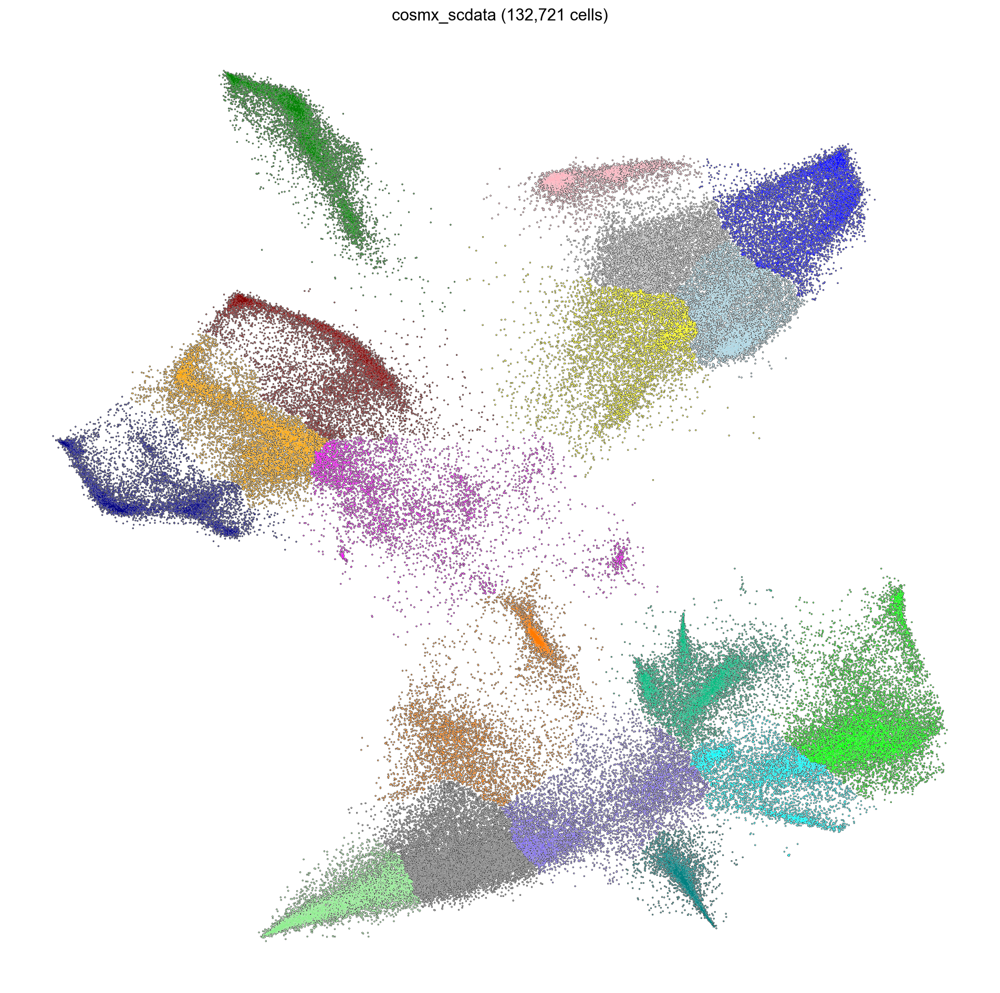

In [22]:
adata_cosmx.umap(group = 'celltype', size = 3)

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


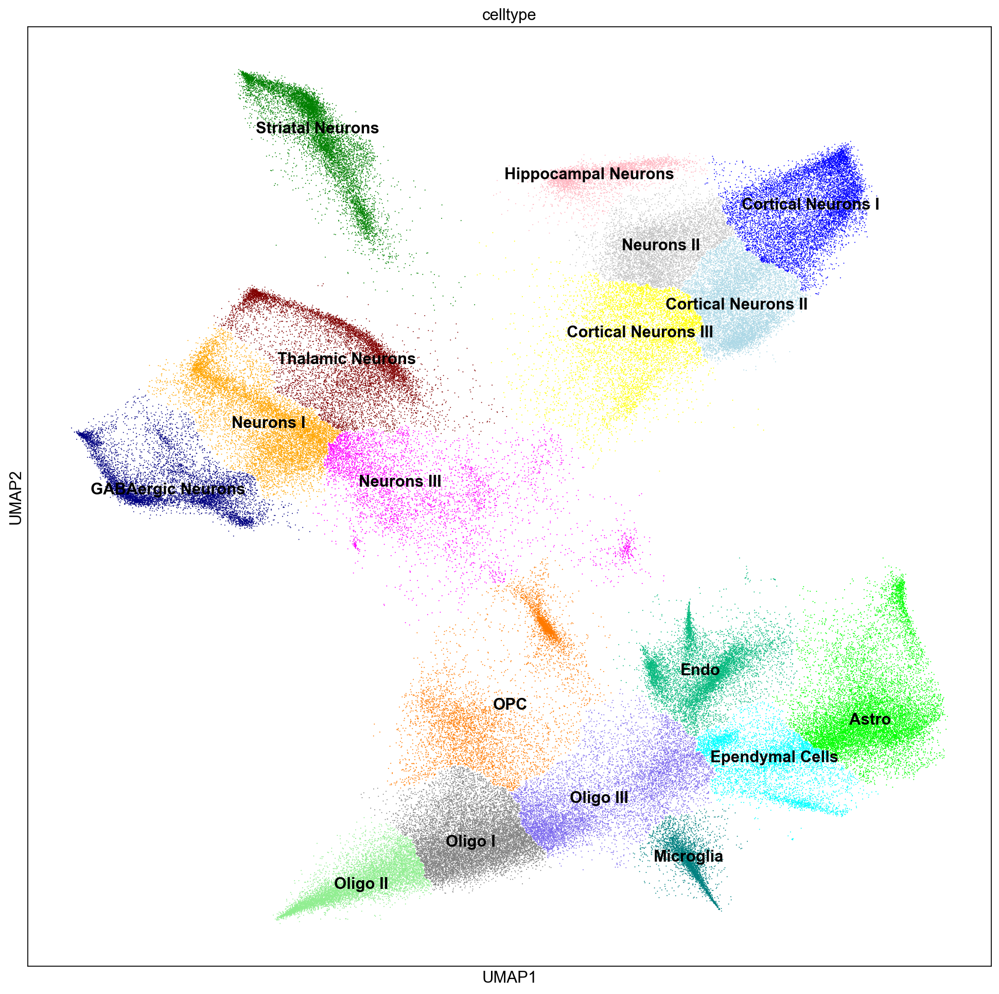

In [23]:
sc.pl.umap(cosmx_scdata, color = 'celltype', legend_loc = 'on data', size = 3)

### Plot Brain Proj

In [8]:
left_side_scdata = cosmx_scdata[cosmx_scdata.obsm['X_spatial'][:, 0] < -445000]
left_side_scdata

View of AnnData object with n_obs × n_vars = 69244 × 950
    obs: 'total_counts', 'leiden', 'celltype', 'x'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'x_colors'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
right_side_scdata = cosmx_scdata[cosmx_scdata.obsm['X_spatial'][:, 0] >= -445000]
right_side_scdata

View of AnnData object with n_obs × n_vars = 63477 × 950
    obs: 'total_counts', 'leiden', 'celltype', 'x'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'x_colors'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [17]:
hd_175_2_scdata = right_side_scdata[right_side_scdata.obsm['X_spatial'][:, 1] > 15000]
hd_175_2_scdata

View of AnnData object with n_obs × n_vars = 31027 × 950
    obs: 'total_counts', 'leiden', 'celltype', 'x'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'x_colors'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [9]:
cntr_7_3_scdata = left_side_scdata[left_side_scdata.obsm['X_spatial'][:, 1] < 20000]
cntr_7_3_scdata

View of AnnData object with n_obs × n_vars = 33375 × 950
    obs: 'total_counts', 'leiden', 'celltype', 'x'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'x_colors'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
adata_cosmx_cntr_7_3 = Jenie(cntr_7_3_scdata, 'cntr_7_3_scdata', 'cntr_7_3_scdata', pallete = 'cosmx_celltype')

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


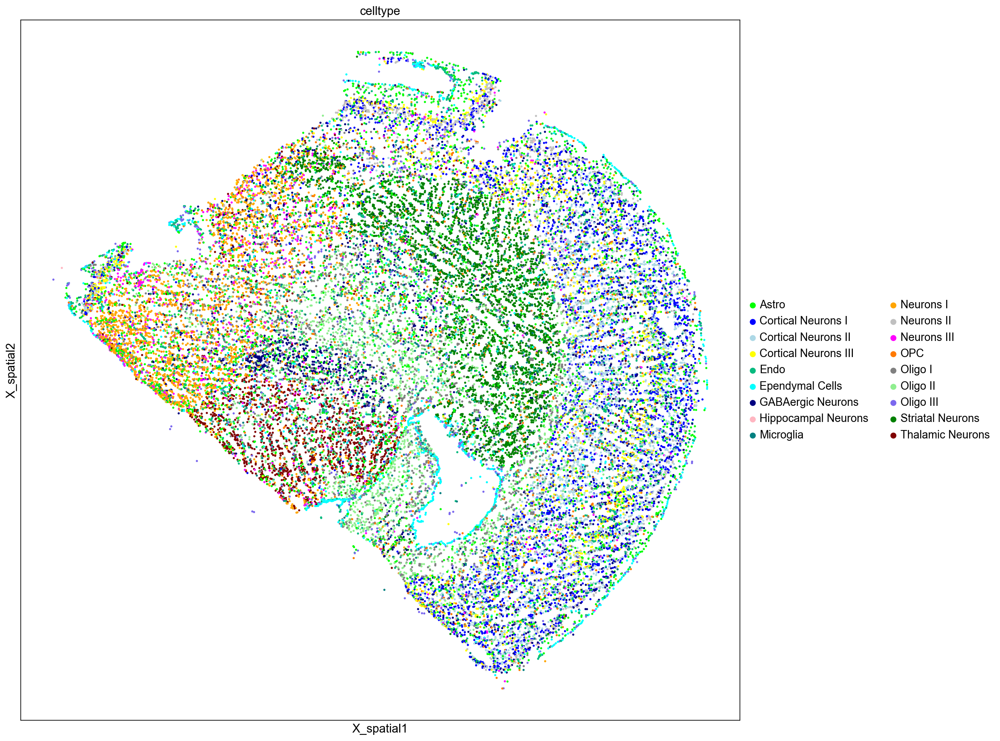

In [11]:
sc.pl.embedding(cntr_7_3_scdata, basis = 'X_spatial', color = 'celltype', size = 25)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


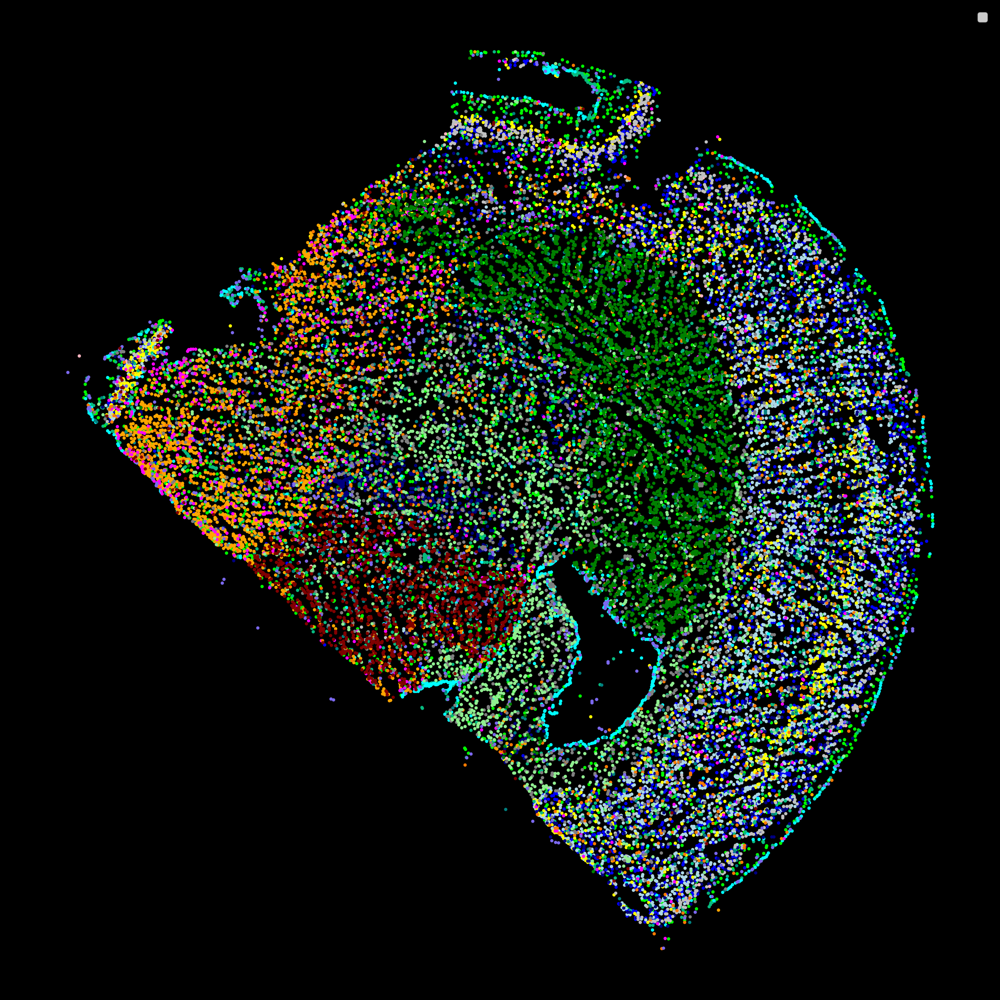

In [12]:
adata_cosmx_cntr_7_3.plot_cluster_scdata(group = 'celltype', sbig = 25)

In [19]:
adata_cosmx_hd_175_2 = Jenie(hd_175_2_scdata, 'hd_175_2_scdata', 'hd_175_2_scdata', pallete = 'cosmx_celltype')

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


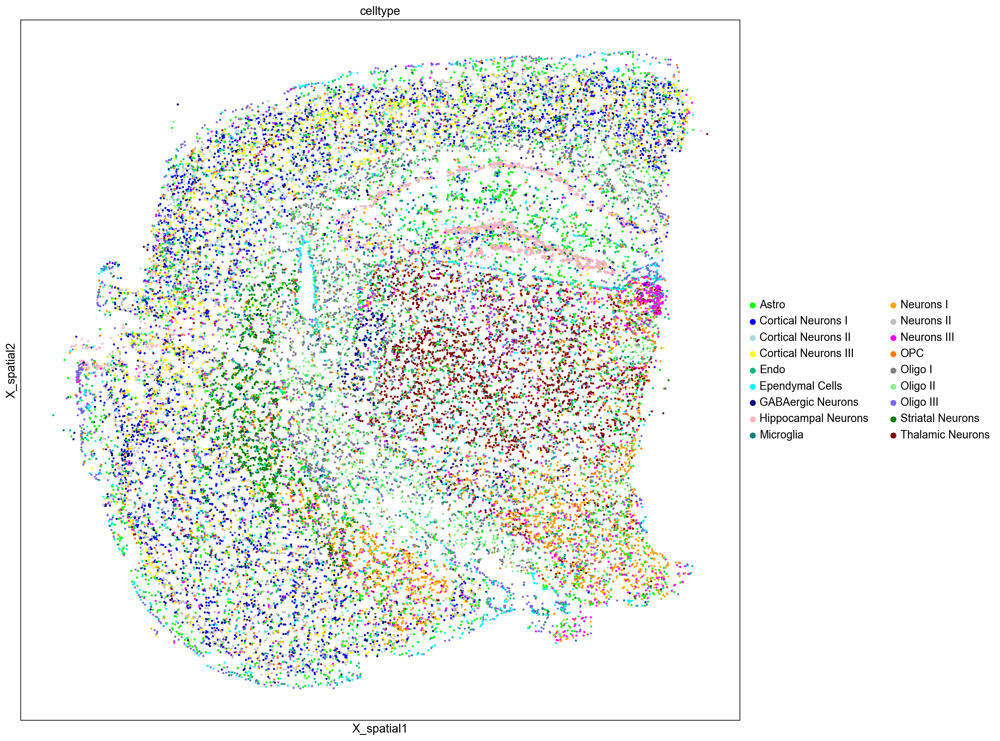

In [20]:
sc.pl.embedding(hd_175_2_scdata, basis = 'X_spatial', color = 'celltype', size = 25)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


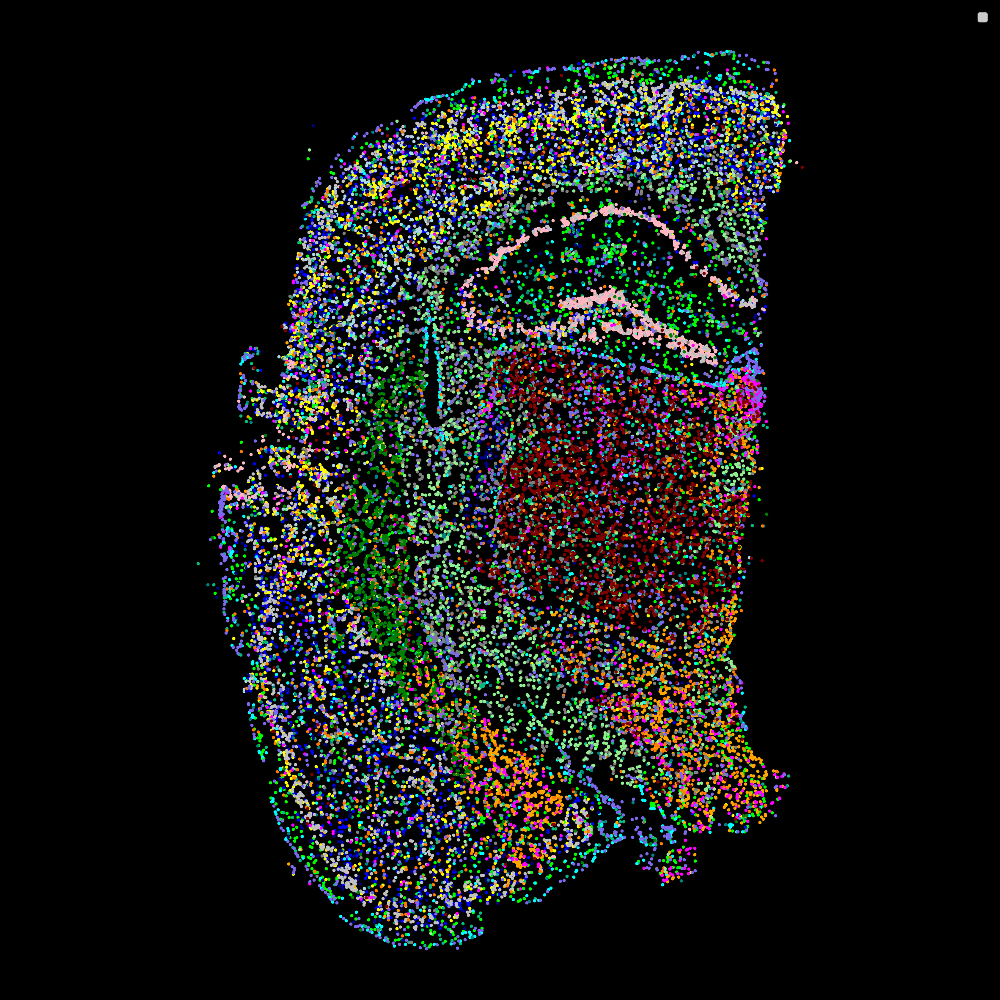

In [21]:
adata_cosmx_hd_175_2.plot_cluster_scdata(group = 'celltype', sbig = 25)